In [279]:
!which python 
!whoami 
!hostname
!pwd

/home/farshed.abdukhakimov/.conda/envs/psps/bin/python
farshed.abdukhakimov
cn-02
/home/farshed.abdukhakimov/projects/sania


In [280]:
import os
import sys
import urllib.request
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

import numpy as np

import torch
from torch.utils.data import TensorDataset, DataLoader
import torch.utils.data as data_utils
from torch.optim import SGD, Adam, Adagrad, Adadelta

from sklearn.datasets import load_svmlight_file

import matplotlib.pyplot as plt

import experiments.loss_functions as lf
from experiments.utils import get_dataset

# import scipy
import optuna 

torch.set_default_dtype(torch.float64)

%load_ext line_profiler

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


In [281]:
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device = torch.device('cpu')

In [282]:
def ridge(w, X, y, mu=1e-8):
    return torch.mean(torch.log(1 + torch.exp(-y * (X @ w)))) + mu/2 * torch.norm(w)**2

def grad_ridge(w, X, y, mu=1e-8):
    r = torch.exp(-y * (X @ w))
    return ( (r/(1 + r)) @ (X * -y[:, None]) ) / X.shape[0] + mu * w

def hess_ridge(w, X, y, mu=1e-8):
    r = torch.exp(-y * (X @ w))
    return ( X.T @ (  (r/torch.square(1 + r)).reshape(-1, 1) * X ) ) / X.shape[0] + mu

def desc_mx(X, y):
    print(f"{X.shape=} \n"
          f"{X.min()=} \n"
          f"{X.max()=} \n"
          f"{y.unique()=} \n"
          f"{torch.linalg.cond(X)=} \n"
          f"Sparsity={1.0 - torch.count_nonzero(X) / X.numel()} \n\n"
          )

In [283]:
torch.manual_seed(0)
np.random.seed(0)

dataset_name = "mushrooms"
batch_size = 256
# dataset_url = f"https://www.csie.ntu.edu.tw/~cjlin/libsvmtools/datasets/binary/{dataset_name}"
# dataset_src = urllib.request.urlopen(dataset_url)
# trainX, trainY = load_svmlight_file(dataset_src)

datasets_path = os.getenv("LIBSVM_DIR")
# sample = np.random.choice(trainX.shape[0], round(trainX.shape[0] * percentage), replace=False)
# assert sample.shape == np.unique(sample).shape
# trainX = trainX[sample]
# trainY = trainY[sample]
trainX, trainY = load_svmlight_file(f"{datasets_path}/{dataset_name}")

train_data = torch.tensor(trainX.toarray())
train_target = torch.tensor(trainY)

train_load = TensorDataset(train_data, train_target)
train_dataloader = DataLoader(train_load, batch_size=batch_size, shuffle=False)


scale = 6
r1 = -scale
r2 = scale
scaling_vec = (r1 - r2) * torch.rand(train_data.shape[1]) + r2
scaling_vec = torch.pow(torch.e, scaling_vec)
train_data_scaled = scaling_vec * train_data

train_load_scaled = TensorDataset(train_data_scaled, train_target)
train_dataloader_scaled = DataLoader(train_load_scaled, batch_size=batch_size, shuffle=False)


train_data_scaled_normalized_minmax = (train_data_scaled - train_data_scaled.min()) / (train_data_scaled.max() - train_data_scaled.min())
train_load_scaled_normalized_minmax = TensorDataset(train_data_scaled_normalized_minmax, train_target)
train_dataloader_scaled_normalized_minmax = DataLoader(train_load_scaled_normalized_minmax, batch_size=batch_size, shuffle=False)

train_data_scaled_normalized_norm = train_data_scaled / torch.norm(train_data_scaled)
train_load_scaled_normalized_norm = TensorDataset(train_data_scaled_normalized_norm, train_target)
train_dataloader_scaled_normalized_norm = DataLoader(train_load_scaled_normalized_norm, batch_size=batch_size, shuffle=False)


train = train_data, train_target, train_dataloader
train_scaled = train_data_scaled, train_target, train_dataloader_scaled
train_scaled_normalized_minmax = train_data_scaled_normalized_minmax, train_target, train_dataloader_scaled_normalized_minmax
train_scaled_normalized_norm = train_data_scaled_normalized_norm, train_target, train_dataloader_scaled_normalized_norm


loss_function = lf.logreg
loss_grad = lf.grad_logreg
loss_hessian = lf.hess_logreg


if loss_function in [lf.logreg, ridge]:
    train_target[train_target == train_target.unique()[0]] = torch.tensor(-1.0, dtype=torch.get_default_dtype())
    train_target[train_target == train_target.unique()[1]] = torch.tensor(1.0, dtype=torch.get_default_dtype())
    assert torch.equal(train_target.unique(), torch.tensor([-1.0, 1.0]))

elif loss_function == lf.nllsq:
    train_target[train_target == train_target.unique()[0]] = 0.0
    train_target[train_target == train_target.unique()[1]] = 1.0
    assert torch.equal(train_target.unique(), torch.tensor([0.0, 1.0]))


desc_mx(train_data, train_target)
desc_mx(train_data_scaled, train_target)
print(loss_function.__name__)

X.shape=torch.Size([8124, 112]) 
X.min()=tensor(0.) 
X.max()=tensor(1.) 
y.unique()=tensor([-1.,  1.]) 
torch.linalg.cond(X)=tensor(1.8663e+19) 
Sparsity=0.8125 


X.shape=torch.Size([8124, 112]) 
X.min()=tensor(0.) 
X.max()=tensor(382.3914) 
y.unique()=tensor([-1.,  1.]) 
torch.linalg.cond(X)=tensor(1.3008e+20) 
Sparsity=0.8125 


logreg


In [36]:
np.random.seed(0)
n = 1000
d = 100
dataset_name = f"synthetic-regression-{n}x{d}"
modified = False
A = np.random.randn(n,d)

if modified:
    U, S, VH = np.linalg.svd(A)
    S *= 0.0
    S = np.asarray([1/((x+1)**2) for x in range(S.shape[0])])
    A = np.dot(U[:, :S.shape[0]] * S, VH)
    dataset_name += "-modified"

xopt = np.random.randn(d)
b = A @ xopt 
train_data = torch.Tensor(A)
train_target = torch.Tensor(b)
xopt = torch.Tensor(xopt)

batch_size = 1000
EPOCHS = 100

train_load = data_utils.TensorDataset(train_data, train_target)
train_dataloader = DataLoader(train_load, batch_size=batch_size, shuffle=False)


scale = 1
r1 = -scale
r2 = scale
scaling_vec = (r1 - r2) * torch.rand(train_data.shape[1]) + r2
scaling_vec = torch.pow(torch.e, scaling_vec)
train_data_scaled = scaling_vec * train_data

train_load_scaled = torch.utils.data.TensorDataset(train_data_scaled, train_target)
train_dataloader_scaled = torch.utils.data.DataLoader(train_load_scaled, batch_size=batch_size, shuffle=False)

train = [train_data, train_target, train_dataloader]
train_scaled = [train_data_scaled, train_target, train_dataloader_scaled]

loss_function = lf.mse
loss_grad = lf.grad_mse
loss_hessian = lf.hess_mse

train_data.shape, torch.linalg.cond(train_data), torch.linalg.cond(train_data_scaled)

(torch.Size([1000, 100]), tensor(1.8599), tensor(8.0908))

In [61]:
torch.manual_seed(0)
np.random.seed(0)

n = 1000
d = 1000

train_data = np.random.randn(n, d)
train_data = (train_data + train_data.T) / 2
w_star = np.random.randn(d)

batch_size = 200
EPOCHS = 100

# U, S, VH = np.linalg.svd(train_data)
# S *= 0.0
# S = np.asarray([1/((x+1)**2) for x in range(S.shape[0])])
# train_data = np.dot(U[:, :S.shape[0]] * S, VH)

dataset_name = f"synthetic-classification-{n}x{d}"

train_target = train_data @ w_star
train_target[train_target < 0.0] = -1.0
train_target[train_target > 0.0] = 1.0

train_data = torch.Tensor(train_data)
train_target = torch.Tensor(train_target)

train_load = TensorDataset(train_data, train_target)
train_dataloader = DataLoader(train_load, batch_size=batch_size, shuffle=False)

scale = 6
r1 = -scale
r2 = scale
scaling_vec = (r1 - r2) * torch.rand(train_data.shape[1]) + r2
scaling_vec = torch.pow(torch.e, scaling_vec)
train_data_scaled = scaling_vec * train_data

train_load_scaled = TensorDataset(train_data_scaled, train_target)
train_dataloader_scaled = DataLoader(train_load_scaled, batch_size=batch_size, shuffle=False)


train_data_scaled_normalized_minmax = (train_data_scaled - train_data_scaled.min()) / (train_data_scaled.max() - train_data_scaled.min())
train_load_scaled_normalized_minmax = TensorDataset(train_data_scaled_normalized_minmax, train_target)
train_dataloader_scaled_normalized_minmax = DataLoader(train_load_scaled_normalized_minmax, batch_size=batch_size, shuffle=False)

train_data_scaled_normalized_norm = train_data_scaled / torch.norm(train_data_scaled)
train_load_scaled_normalized_norm = TensorDataset(train_data_scaled_normalized_norm, train_target)
train_dataloader_scaled_normalized_norm = DataLoader(train_load_scaled_normalized_norm, batch_size=batch_size, shuffle=False)


train = train_data, train_target, train_dataloader
train_scaled = train_data_scaled, train_target, train_dataloader_scaled
train_scaled_normalized_minmax = train_data_scaled_normalized_minmax, train_target, train_dataloader_scaled_normalized_minmax
train_scaled_normalized_norm = train_data_scaled_normalized_norm, train_target, train_dataloader_scaled_normalized_norm



loss_function = lf.logreg
# loss_grad = lf.grad_logreg
# loss_hessian = lf.hess_logreg


if loss_function in [lf.logreg, ridge]:
    train_target[train_target == train_target.unique()[0]] = torch.tensor(-1.0, dtype=torch.get_default_dtype())
    train_target[train_target == train_target.unique()[1]] = torch.tensor(1.0, dtype=torch.get_default_dtype())
    assert torch.equal(train_target.unique(), torch.tensor([-1.0, 1.0]))

elif loss_function == lf.nllsq:
    train_target[train_target == train_target.unique()[0]] = 0.0
    train_target[train_target == train_target.unique()[1]] = 1.0
    assert torch.equal(train_target.unique(), torch.tensor([0.0, 1.0]))

print("train_data:")
desc_mx(train_data, train_target)
print("train_data_scaled:")
desc_mx(train_data_scaled, train_target)
print(loss_function.__name__)

train_data:
X.shape=torch.Size([1000, 1000]) 
X.min()=tensor(-3.2768) 
X.max()=tensor(3.4887) 
y.unique()=tensor([-1.,  1.]) 
torch.linalg.cond(X)=tensor(2531.8414) 
Sparsity=0.0 


train_data_scaled:
X.shape=torch.Size([1000, 1000]) 
X.min()=tensor(-1250.2118) 
X.max()=tensor(1108.5549) 
y.unique()=tensor([-1.,  1.]) 
torch.linalg.cond(X)=tensor(50207964.6006) 
Sparsity=0.0 


logreg


In [1153]:
(np.sign(train_data @ w_star) == train_target).sum() / train_target.shape[0]

tensor(1.)

In [284]:
def run_optimizer(optimizer, dataset, EPOCHS, seed=0, **kwargs_optimizer):

    data, target, dataloader = dataset

    torch.manual_seed(seed)

    # parameters
    w = torch.zeros(data.shape[1], device=device).requires_grad_()
    opt = optimizer([w], **kwargs_optimizer)

    # logging 
    hist = []
    
    def compute_loss(w, data, target):
        loss = loss_function(w, data, target)
        loss.backward()
        return loss
    
    for epoch in range(EPOCHS):

        loss = loss_function(w, data.to(device), target.to(device))
        g, = torch.autograd.grad(loss, w, create_graph=True)
        acc = (np.sign(data @ w.detach().numpy()) == target).sum() / target.shape[0]
        print(f"[{epoch}/{EPOCHS}] | Loss: {loss.item()} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()} | Acc: {acc}")
        hist.append([loss.item(), (torch.linalg.norm(g) ** 2).item(), acc])

        for i, (batch_data, batch_target) in enumerate(dataloader):
            batch_data = batch_data.to(device)
            batch_target = batch_target.to(device)
            opt.zero_grad()
            loss = compute_loss(w, batch_data, batch_target)
            opt.step()
    return hist


def save_results(result, dataset_name, percentage, scale, batch_size, epochs, loss_function_name, optimizer_name, lr, 
                 precond_method, pcg_method, hutch_init_iters, seed):
    
    results_path = os.getenv("RESULTS_DIR")
    directory = f"{results_path}/{dataset_name}/percentage_{percentage}/scale_{scale}/bs_{batch_size}" \
    f"/epochs_{epochs}/{loss_function_name}/{optimizer_name}/lr_{lr}/precond_{precond_method}/pcg_method_{pcg_method}/hutch_init_iters_{hutch_init_iters}/seed_{seed}"

    print(directory)
    if not os.path.exists(directory):
        os.makedirs(directory)
        
    torch.save([x[0] for x in result], f"{directory}/loss")
    torch.save([x[1] for x in result], f"{directory}/grad_norm_sq")
    torch.save([x[2] for x in result], f"{directory}/acc")
    if precond_method == "pcg":
        torch.save([x[3] for x in result], f"{directory}/cg_steps")

In [285]:
dataset_name

'mushrooms'

In [286]:
# epochs = 500

# # "duke-6-500-16-adam-nllsq": -14,
# # "duke-6-500-16-adagrad-nllsq": -12,
# # "duke-6-500-16-adadelta-nllsq": -4,

# # "leu-6-500-16-adam-nllsq": -14,
# # "leu-6-500-16-adagrad-nllsq": -12,
# # "leu-6-500-16-adadelta-nllsq": -2,

# for opt, lr_pow in zip([Adam, Adagrad, Adadelta], [-14, -12, -2]):
#     for seed in [0, 1, 2, 3, 4]:
#         for dataset, sc in zip([train, train_scaled], [0, scale]):

#             # study_name = f"{dataset_name}-{scale}-{epochs}-{batch_size}-{opt.__name__.lower()}-{loss_function.__name__.lower()}"
#             # print(study_name)
#             # storage_name = f"sqlite:///experiments/optuna/{study_name}.db"
#             # study = optuna.load_study(study_name=study_name, storage=storage_name)
#             # lr = study.best_params["lr"]

#             lr = 2**lr_pow
#             hist = run_optimizer(opt, dataset, epochs, lr=lr)
#             save_results(hist, dataset_name, 1.0, sc, batch_size, epochs, loss_function.__name__, opt.__name__.lower(), lr, "none", "none", 1000, seed)
#             print("Done!")


# PSPS2 Rank 1 Scaling
$
w^* = \arg\min_{w\in\mathbb{R} ^d}\frac{1}{2} \|w - w_t\|_{B_t} \nonumber \\
      \text{s.t.} \quad f_i(w_t) +  \langle  \nabla  f_i(w_t), w-w_t\rangle +\frac{1}{2}\langle B_t(w-w^t), w - w^t \rangle \leq 0 \\ 
      B_t = \frac{yy^T}{s^Ty} \\ 
      B_t^{+} = \frac{ss^T}{s^Ty} \\ 
      \text{where} \quad s = \Big ( \nabla^2  f_i(w_t) \Big ) ^{-1} \nabla f_i(w_t) \\ 
      y = \nabla^2 f_i(w_t) s = \nabla f_i(w_t) \\ 
      \text{Update Rule: } \\
      w_{t+1} = w_t - \frac{\alpha}{1 + \alpha} B_t^{+} \nabla f_i(w_t)
$

In [291]:
def rademacher_old(weights):
    return torch.round(torch.rand_like(weights)) * 2 - 1

def diag_estimate_old(weights, grad, iters):
    Ds = []
    for j in range(iters):
        z = rademacher_old(weights)
        with torch.no_grad():
            hvp = torch.autograd.grad(grad, weights, grad_outputs=z, retain_graph=True)[0]
        Ds.append((hvp*z))
    return torch.mean(torch.stack(Ds), 0)

def ttv(tuple_in):
    return torch.cat([t.view(-1) for t in tuple_in])

def flat_hessian(flat_grads, params):
    full_hessian = []
    for i in range(flat_grads.size()[0]):
        temp_hess = torch.autograd.grad(flat_grads[i], params, retain_graph=True)
        full_hessian.append(ttv(temp_hess))
    return torch.stack(full_hessian)

def run_psps2(dataset, epochs, precond_method, pcg_method="none", seed=0, **kwargs):

    torch.manual_seed(seed)
    np.random.seed(seed)

    data, target, dataloader = dataset

    eps = kwargs.get("eps", 1e-6)
    
    # parameters
    w = torch.zeros(data.shape[1], device=device).requires_grad_()

    # save loss and grad size to history
    hist = []

    opt = Adam([w], lr=0.1)
    
    opt.zero_grad()
    loss = loss_function(w, data.to(device), target.to(device))
    g, = torch.autograd.grad(loss, w, create_graph=True)
    f_grad = g.clone().detach() 


    if precond_method == "none":
        D = torch.ones_like(w)
    elif precond_method == "hutch":
        alpha=0.1
        beta=0.999
        init_iters = kwargs.get("hutch_init_iters", 20_000)
        Dk = diag_estimate_old(w, g, init_iters)
    elif precond_method == "pcg":
        MAX_ITER = train_data.shape[1] * 2

    elif precond_method == "scaling_vec":
        scaling_vec = kwargs["scaling_vec"]
        D = (1 / scaling_vec)**2
    elif precond_method == "adam" or precond_method == "adam_m":
        D = torch.zeros_like(g)
        v = torch.zeros_like(g)
        step_t = torch.tensor(0.)
        betas = (0.9, 0.999)
    elif precond_method == "adagrad" or precond_method == "adagrad_m":
        D = torch.zeros_like(g)
        v = torch.zeros_like(g)

    if pcg_method == "hutch":
        alpha=1e-5
        beta=0.999
        init_iters = 1_000
        Dk_pcg = diag_estimate_old(w, g, init_iters)
        Dk_hat = torch.abs(Dk_pcg)
        Dk_hat[Dk_hat < alpha] = alpha
    elif pcg_method == "adam" or pcg_method == "adam_m":
        D_pcg = torch.zeros_like(g)
        v_pcg = torch.zeros_like(g)
        step_t_pcg = torch.tensor(0.)
        betas = (0.9, 0.999)
    elif pcg_method == "adagrad" or pcg_method == "adagrad_m":
        D_pcg = torch.zeros_like(g)
        v_pcg = torch.zeros_like(g)
    elif pcg_method == "none":
        D_pcg = torch.ones_like(g)
    elif pcg_method == "hess_diag":
        closure = lambda w: loss_function(w, data, target)
        hess = torch.autograd.functional.hessian(closure, w)
        # hess_diag_inv = 1 / torch.diag(torch.autograd.functional.hessian(closure, w))
        # hess_diag_inv = 1 / torch.diag(loss_hessian(w, data, target))
        # hess = flat_hessian(g,[w])
        D_pcg = 1 / torch.diag(hess)
    elif pcg_method == "hess":
        # closure = lambda w: loss_function(w, data, target)
        # hess_inv = torch.inverse(torch.autograd.functional.hessian(closure, w))
        hess_inv = torch.inverse(loss_hessian(w, data, target))
        D_pcg = hess_inv.clone()

    # EVAL
    loss = loss_function(w, data.to(device), target.to(device))
    g, = torch.autograd.grad(loss, w, create_graph=True)
    grad_norm_sq = torch.linalg.norm(g) ** 2  
    acc = (np.sign(data @ w.detach().numpy()) == target).sum() / target.shape[0]
    hist.append([loss.item(), grad_norm_sq.item(), acc, 0])
    # END EVAL
        

    for epoch in range(epochs):
        cg_steps_per_epoch = 0
        
        for i, (batch_data, batch_target) in enumerate(dataloader): 
            opt.zero_grad()
            loss = loss_function(w, batch_data, batch_target)
            g, = torch.autograd.grad(loss, w, create_graph=True)
            f_grad = g.detach().clone()


            if precond_method == "hess_diag":
                closure = lambda w: loss_function(w, batch_data, batch_target)
                hess = torch.autograd.functional.hessian(closure, w)
                # hess = loss_hessian(w, data, target)
                # hess_diag_inv = 1 / torch.diag(hess)
                s = f_grad / torch.diag(hess)

            elif precond_method == "newton":
                closure = lambda w: loss_function(w, batch_data, batch_target)
                hess = torch.autograd.functional.hessian(closure, w)
                # hess = loss_hessian(w, batch_data, batch_target)
                s = torch.linalg.solve(hess, f_grad)

            elif precond_method == "scaling_vec":
                s = D * f_grad

            elif precond_method in ("adam", "adam_m"):
                step_t += 1
                v = betas[1] * v + (1 - betas[1]) * g.square()
                v_hat = v / (1 - torch.pow(betas[1], step_t))

                if precond_method == "adam":
                    D = 1 / (torch.sqrt(v_hat) + eps)
                else:
                    D = 1 / (v_hat + eps) 
                s = D * f_grad

            elif precond_method in ("adagrad", "adagrad_m"):
                v.add_(torch.square(g))
                if precond_method == "adagrad":
                    D = 1 / (torch.sqrt(v) + eps)
                else:
                    D = 1 / (v + eps)
                s = D * f_grad

            elif precond_method == "scipy_cg":
                closure = lambda w: loss_function(w, batch_data, batch_target)
                hess = torch.autograd.functional.hessian(closure, w)
                A = scipy.sparse.csc_matrix(hess.detach().numpy())
                s, exit_code = scipy.sparse.linalg.cg(A, f_grad.numpy(), tol=1e-10)
                s = torch.tensor(s)

            elif precond_method == "none":
                s = D * f_grad

            elif precond_method == "hutch":
                vk = diag_estimate_old(w, g, 1)

                # Smoothing and Truncation 
                Dk = beta * Dk + (1 - beta) * vk
                Dk_hat = torch.abs(Dk)
                Dk_hat[Dk_hat < alpha] = alpha

                D = 1 / Dk_hat
                s = D * f_grad

            elif precond_method == "pcg":

                if pcg_method == "hutch":
                    # vk_pcg = diag_estimate_old(w, g, 1)
                    # # Smoothing and Truncation 
                    # Dk_pcg = beta * Dk_pcg + (1 - beta) * vk_pcg
                    # Dk_hat = torch.abs(Dk_pcg)
                    # Dk_hat[Dk_hat < alpha] = alpha
                    D_pcg = 1 / Dk_hat

                elif pcg_method == "adam":
                    step_t_pcg += 1
                    v_pcg = betas[1] * v_pcg + (1 - betas[1]) * f_grad.square()
                    v_hat = v_pcg / (1 - torch.pow(betas[1], step_t_pcg))
                    # if pcg_method == "adam":
                    # D_pcg = 1 / (torch.sqrt(v_hat) + eps)
                    # else:
                    D_pcg = 1 / (v_hat + eps)                

                elif pcg_method == "adagrad":
                    v_pcg.add_(f_grad.square())
                    # if pcg_method == "adagrad":
                    # D_pcg = 1 / (torch.sqrt(v_pcg) + eps)
                    # else:   
                    D_pcg = 1 / (v_pcg + eps)

                M_inv = D_pcg.clone()
                # Preconditioned CG is here
                s = torch.zeros_like(w) # s = H_inv * grad
                r = f_grad.clone()
                z = M_inv * r
                p = z.clone()

                for cg_step in range(MAX_ITER):
                    hvp = torch.autograd.grad(g, w, grad_outputs=p, retain_graph=True)[0]
                    if torch.dot(p, hvp) <= 0:
                        # gamma = 0.7
                        gamma = 0.999
                        s = gamma * s + (1 - gamma) * p * torch.sign(torch.dot(p, f_grad))
                        # hvs = torch.autograd.grad(g, w, grad_outputs=s, retain_graph=True)[0]
                        step_size=torch.min(torch.tensor([torch.abs(loss/torch.dot(s, f_grad)), 1]))
                        # print("Hit!")
                        break
                    
                    alpha_k = torch.dot(r, z) / torch.dot(p, hvp)
                    s = s + alpha_k * p
                    r_prev = r.clone()
                    r = r - alpha_k * hvp

                    if torch.dot(r, M_inv * r) < 1e-1:
                        grad_norm_sq_scaled = torch.dot(f_grad, s)
                        if 2 * loss <= grad_norm_sq_scaled:
                            c = loss / ( grad_norm_sq_scaled )
                            det = 1 - 2 * c
                            if det < 0.0:
                                step_size = 1.0 
                            else:
                                step_size = 1 - torch.sqrt(det)
                        else:
                            step_size = 1.0
                        cg_steps_per_epoch += cg_step + 1
                        break

                    z_prev = z.clone()
                    z = M_inv * r
                    beta_k = torch.dot(r, z) / torch.dot(r_prev, z_prev)
                    p = z + beta_k * p    

            grad_norm_sq_scaled = torch.dot(f_grad, s)
            if 2 * loss <= grad_norm_sq_scaled:
                c = loss / ( grad_norm_sq_scaled )
                det = 1 - 2 * c
                if det < 0.0:
                    step_size = 1.0 
                else:
                    step_size = 1 - torch.sqrt(det)
            else:
                step_size = 1.0
            
            if loss < 1e-30:
                continue
            with torch.no_grad():
                w.sub_(s * step_size)

        # EVAL
        loss = loss_function(w, data.to(device), target.to(device))
        g, = torch.autograd.grad(loss, w, create_graph=True)
        grad_norm_sq = torch.linalg.norm(g) ** 2  
        acc = (np.sign(data @ w.detach().numpy()) == target).sum() / target.shape[0]
        if epoch % 100 == 0:
            print(f"[{epoch}/{epochs}] | Loss: {loss.item()} | GradNorm^2: {grad_norm_sq.item()} | Accuracy: {acc}")
        hist.append([loss.item(), grad_norm_sq.item(), acc, hist[-1][3] + cg_steps_per_epoch])
        # hist.append([loss.item(), grad_norm_sq.item(), acc])
        # END EVAL


        # cg_steps_total.append(cg_steps_total[-1] + cg_steps_per_epoch)

    return hist

In [9]:
EPOCHS = 100
method = "adam_m"
pcg_method = "none"

hist = run_psps2(train, EPOCHS, method, pcg_method, eps=0.0)
hist_scaled = run_psps2(train_scaled, EPOCHS, method, pcg_method, eps=0.0)

[0/500] | Loss: 0.092906481849932 | GradNorm^2: 2.8002156913721747 | Accuracy: 1.0
[100/500] | Loss: 0.0 | GradNorm^2: 2.3283703486554444e-31 | Accuracy: 1.0
[200/500] | Loss: 0.0 | GradNorm^2: 2.3283703486554444e-31 | Accuracy: 1.0
[300/500] | Loss: 0.0 | GradNorm^2: 2.3283703486554444e-31 | Accuracy: 1.0
[400/500] | Loss: 0.0 | GradNorm^2: 2.3283703486554444e-31 | Accuracy: 1.0
[0/500] | Loss: 0.0929064818499319 | GradNorm^2: 17662.64222827373 | Accuracy: 1.0
[100/500] | Loss: 0.0 | GradNorm^2: 1.4987380176840691e-27 | Accuracy: 1.0
[200/500] | Loss: 0.0 | GradNorm^2: 1.4987380176840691e-27 | Accuracy: 1.0
[300/500] | Loss: 0.0 | GradNorm^2: 1.4987380176840691e-27 | Accuracy: 1.0
[400/500] | Loss: 0.0 | GradNorm^2: 1.4987380176840691e-27 | Accuracy: 1.0


In [10]:
hist_adam = run_optimizer(Adam, train, EPOCHS, lr=2**-12)
hist_adam_scaled = run_optimizer(Adam, train_scaled, EPOCHS, lr=2**-12)

[0/500] | Loss: 0.6931471805599453 | GradNorm^2: 99.73101543798441 | Acc: 0.0
[1/500] | Loss: 0.4447661326176078 | GradNorm^2: 40.927337814275056 | Acc: 0.868421052631579
[2/500] | Loss: 0.29387553475748096 | GradNorm^2: 15.073594076634564 | Acc: 0.9736842105263158
[3/500] | Loss: 0.21073961186444856 | GradNorm^2: 7.928696516018554 | Acc: 1.0
[4/500] | Loss: 0.15779830711260084 | GradNorm^2: 4.619919718721615 | Acc: 1.0
[5/500] | Loss: 0.12182012893648898 | GradNorm^2: 2.870721898417641 | Acc: 1.0
[6/500] | Loss: 0.09646637665498022 | GradNorm^2: 1.8884947651051143 | Acc: 1.0
[7/500] | Loss: 0.07801968422023471 | GradNorm^2: 1.283601630530683 | Acc: 1.0
[8/500] | Loss: 0.06428002770353723 | GradNorm^2: 0.8875788615327016 | Acc: 1.0
[9/500] | Loss: 0.05390035943724912 | GradNorm^2: 0.6237041066938888 | Acc: 1.0
[10/500] | Loss: 0.045986068263489 | GradNorm^2: 0.44850300341820715 | Acc: 1.0
[11/500] | Loss: 0.03989620374980482 | GradNorm^2: 0.33256086048539063 | Acc: 1.0
[12/500] | Loss:

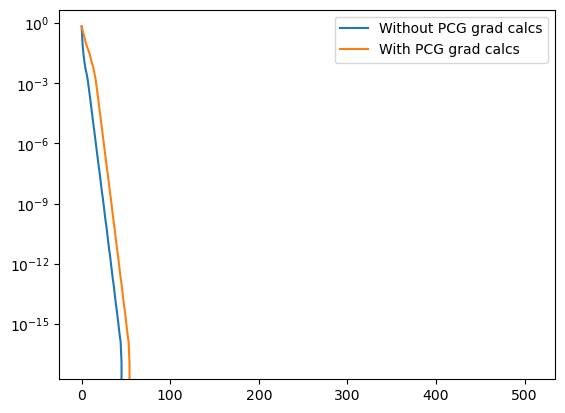

In [11]:
cg_steps = [x[3] for x in hist]
x1 = np.rint(np.asarray(cg_steps) / np.ceil(train_data.shape[0] / batch_size))


plt.semilogy([x[0] for x in hist], label="Without PCG grad calcs")
plt.semilogy(x1, [x[0] for x in hist], label="With PCG grad calcs")

plt.legend()

Text(0.5, 1.0, 'colon-cancer_bs-16_loss-logreg')

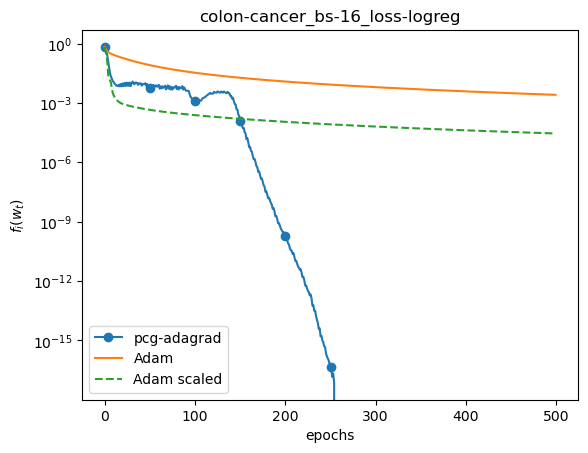

In [239]:
markevery = [x for x in range(0, len(hist), len(hist) // 10)]

# og_linspace = np.linspace(0, len(hist), EPOCHS + cg_steps)
# scaled_linspace = np.linspace(0, len(hist_scaled), EPOCHS + cg_steps_scaled) 


plt.semilogy([x[0] for x in hist], marker="o", markevery=markevery, label=f"{method}-{pcg_method}")
# plt.semilogy(scaled_linspace, [x[0] for x in hist_scaled], linestyle="--", label=f"{method}-{pcg_method} scaled")


# plt.semilogy([x[0] for x in hist2], marker="o", markevery=markevery, label=f"{method2}-{pcg_method2}")
# plt.semilogy([x[0] for x in hist2_scaled], linestyle="--", label=f"{method2}-{pcg_method2} scaled")

plt.semilogy([x[0] for x in hist_adam], label=f"Adam")
plt.semilogy([x[0] for x in hist_adam_scaled], linestyle="--", label=f"Adam scaled")


plt.xlabel("epochs")
plt.ylabel(r"$f_i(w_t)$")
plt.legend()

title = f"{dataset_name}_bs-{batch_size}_loss-{loss_function.__name__}"
plt.title(title)
# fig.savefig(f"experiments/plots/{title}.jpeg", dpi=200)

In [367]:
dataset_name

'leu'

In [390]:
EPOCHS = 500
for method, pcg_method in zip(["pcg", "pcg", "pcg"], ["hess_diag", "adam", "adagrad"]):
    for seed in [0, 1, 2, 3, 4]:
        for dataset, eps, scale in zip([train, train_scaled], [0.0, 0.0], [0, scale]):
            hist = run_psps2(dataset, EPOCHS, method, pcg_method, seed=seed, eps=eps)
            save_results(hist, dataset_name, 1.0, scale, batch_size, EPOCHS, loss_function.__name__, "psps2", 1.0, method, pcg_method, 1000, seed)


[0/500] | Loss: 0.01569131401823685 | GradNorm^2: 0.2798756137929393 | Accuracy: 0.7105263157894737
[1/500] | Loss: 0.005231233723099236 | GradNorm^2: 0.032777886249195226 | Accuracy: 0.7105263157894737
[2/500] | Loss: 0.0020862750588999637 | GradNorm^2: 0.0053677641387926195 | Accuracy: 0.7105263157894737
[3/500] | Loss: 0.001214551407413742 | GradNorm^2: 0.0013601021583755288 | Accuracy: 0.7105263157894737
[4/500] | Loss: 0.0007043576391108854 | GradNorm^2: 0.000427339539251081 | Accuracy: 0.7105263157894737
[5/500] | Loss: 0.00038836055037646795 | GradNorm^2: 0.00013237319459012 | Accuracy: 0.7105263157894737
[6/500] | Loss: 0.00019438628656061238 | GradNorm^2: 3.424729628926406e-05 | Accuracy: 0.7105263157894737
[7/500] | Loss: 8.499630585978807e-05 | GradNorm^2: 6.4702883621469675e-06 | Accuracy: 0.7105263157894737
[8/500] | Loss: 3.578097545840461e-05 | GradNorm^2: 1.1731308879488162e-06 | Accuracy: 0.7105263157894737
[9/500] | Loss: 1.547814586650589e-05 | GradNorm^2: 2.14020589

In [ ]:
# EPOCHS = 500
# for seed in [0, 1, 2, 3, 4]:
#     for dataset, eps, scale in zip([train, train_scaled], [1e-1, 1e-5], [0, scale]):
#         hist = run_psps2(dataset, EPOCHS, "pcg", "adagrad", seed=seed, eps=eps)
#         save_results(hist, dataset_name, 1.0, scale, batch_size, EPOCHS, loss_function.__name__, "psps2", 1.0, "pcg", "adagrad", 1000, seed)

# EPOCHS = 500
# lr=0.01

# for opt in [Adam, Adagrad, Adadelta]:
#     for seed in [0, 1, 2, 3, 4]:
#         for dataset, scale in zip([train, train_scaled], [0, scale]):
#             hist = run_optimizer(opt, train, EPOCHS, lr=lr)
#             save_results(hist, dataset_name, 1.0, scale, batch_size, EPOCHS, loss_function.__name__, opt.__name__.lower(), lr, "none", "none", 1000, seed)


In [910]:
for lr_pow in range(-14, -8, 2):
    print(lr_pow)

-14
-12
-10


In [1075]:
EPOCHS = 500

for lr_pow in range(-14, -8, 2):
    lr = 2**lr_pow
    for opt in [Adam, Adagrad, Adadelta]:
        for seed in [0, 1, 2, 3, 4]:
            for dataset, scale in zip([train, train_scaled], [0, scale]):
                hist = run_optimizer(opt, dataset, EPOCHS, lr=lr)
                save_results(hist, dataset_name, 1.0, scale, batch_size, EPOCHS, loss_function.__name__, opt.__name__.lower(), lr, "none", "none", 1000, seed)
print("Done!")

[0/500] | Loss: 0.25 | GradNorm^2: 24.932753859496103 | Acc: 0.2894736842105263
[1/500] | Loss: 0.21153472893533956 | GradNorm^2: 18.671969872439416 | Acc: 0.5789473684210527
[2/500] | Loss: 0.17845781969500304 | GradNorm^2: 13.48028864629108 | Acc: 0.6052631578947368
[3/500] | Loss: 0.15151729376094347 | GradNorm^2: 9.594064162190072 | Acc: 0.631578947368421
[4/500] | Loss: 0.13007939076520159 | GradNorm^2: 7.023616079475381 | Acc: 0.6842105263157895
[5/500] | Loss: 0.11292468611514124 | GradNorm^2: 5.331939137519272 | Acc: 0.6842105263157895
[6/500] | Loss: 0.09896841788074358 | GradNorm^2: 4.15713098524774 | Acc: 0.7105263157894737
[7/500] | Loss: 0.08743622110749598 | GradNorm^2: 3.2971116057236034 | Acc: 0.7105263157894737
[8/500] | Loss: 0.0777965495321828 | GradNorm^2: 2.647192505182909 | Acc: 0.7105263157894737
[9/500] | Loss: 0.06966960095981779 | GradNorm^2: 2.148895458781753 | Acc: 0.7105263157894737
[10/500] | Loss: 0.06276773413103055 | GradNorm^2: 1.7645288172730733 | Acc

In [924]:
EPOCHS = 500
method = "hess_diag"
pcg_method = "none"

for seed in [0, 1, 2, 3, 4]:
    for dataset, eps, scale in zip([train, train_scaled], [0.0, 0.0], [0, scale]):
        hist = run_psps2(dataset, EPOCHS, method, pcg_method, seed=seed, eps=eps)
        save_results(hist, dataset_name, 1.0, scale, batch_size, EPOCHS, loss_function.__name__, "psps2", 1.0, method, pcg_method, 1000, seed)
print("Done!")

[0/500] | Loss: 0.25 | GradNorm^2: 13.271985159000272 | Accuracy: 0.4772727272727273
[1/500] | Loss: 0.08330984229524555 | GradNorm^2: 3.8917758819885564 | Accuracy: 0.5
[2/500] | Loss: 0.03976670727473304 | GradNorm^2: 0.5300484650089177 | Accuracy: 0.5227272727272727
[3/500] | Loss: 0.02259441070147655 | GradNorm^2: 0.41682636039912163 | Accuracy: 0.5227272727272727
[4/500] | Loss: 0.020633793555276784 | GradNorm^2: 1.6553937478344982 | Accuracy: 0.5
[5/500] | Loss: 0.00885724986453375 | GradNorm^2: 0.04129338159511646 | Accuracy: 0.5227272727272727
[6/500] | Loss: 0.010059509802067924 | GradNorm^2: 0.5664200343445499 | Accuracy: 0.5227272727272727
[7/500] | Loss: 0.0030893998857746837 | GradNorm^2: 0.006355357282461336 | Accuracy: 0.5227272727272727
[8/500] | Loss: 0.004695133311664317 | GradNorm^2: 0.2511389766488332 | Accuracy: 0.5227272727272727
[9/500] | Loss: 0.0017254649361222512 | GradNorm^2: 0.001829209243892594 | Accuracy: 0.5227272727272727
[10/500] | Loss: 0.0024419788023

In [1076]:
EPOCHS = 500
method = "pcg"
pcg_method = "hess_diag"

for seed in [0, 1, 2, 3, 4]:
    for dataset, eps, scale in zip([train, train_scaled], [0.0, 0.0], [0, scale]):
        hist = run_psps2(dataset, EPOCHS, method, pcg_method, seed=seed, eps=eps)
        save_results(hist, dataset_name, 1.0, scale, batch_size, EPOCHS, loss_function.__name__, "psps2", 1.0, method, pcg_method, 1000, seed)
print("Done!")

[0/500] | Loss: 0.25 | GradNorm^2: 24.932753859496103 | Accuracy: 0.2894736842105263
[1/500] | Loss: 0.014536674527107867 | GradNorm^2: 0.2417844034047396 | Accuracy: 0.7105263157894737
[2/500] | Loss: 0.0040322384319084375 | GradNorm^2: 0.028534241456582753 | Accuracy: 0.7105263157894737
[3/500] | Loss: 0.0013365758283042475 | GradNorm^2: 0.004153342252166914 | Accuracy: 0.7105263157894737
[4/500] | Loss: 0.0004919793796119774 | GradNorm^2: 0.0006692133528613682 | Accuracy: 0.7105263157894737
[5/500] | Loss: 0.00019536226671220576 | GradNorm^2: 0.00010374937936318155 | Accuracy: 0.7105263157894737
[6/500] | Loss: 8.734167413669978e-05 | GradNorm^2: 2.1075600857065485e-05 | Accuracy: 0.7105263157894737
[7/500] | Loss: 4.6802236812179306e-05 | GradNorm^2: 6.2131525606869945e-06 | Accuracy: 0.7105263157894737
[8/500] | Loss: 2.7065955073972727e-05 | GradNorm^2: 1.75217889791541e-06 | Accuracy: 0.7105263157894737
[9/500] | Loss: 1.607740895884025e-05 | GradNorm^2: 6.885579630385111e-07 | 

In [1080]:
EPOCHS = 500
method = "pcg"
pcg_method = "adagrad"

for seed in [0, 1, 2, 3, 4]:
    for dataset, eps, scale in zip([train, train_scaled], [0.0, 0.0], [0, scale]):
        hist = run_psps2(dataset, EPOCHS, method, pcg_method, seed=seed, eps=eps)
        save_results(hist, dataset_name, 1.0, scale, batch_size, EPOCHS, loss_function.__name__, "psps2", 1.0, method, pcg_method, 1000, seed)
print("Done!")

[0/500] | Loss: 0.25 | GradNorm^2: 13.271985159000272 | Accuracy: 0.4772727272727273
[1/500] | Loss: 0.18395229619539108 | GradNorm^2: 0.9850008329546607 | Accuracy: 0.4090909090909091
[2/500] | Loss: 0.032878154808546195 | GradNorm^2: 0.434860048013718 | Accuracy: 0.5227272727272727
[3/500] | Loss: 0.008975969505603075 | GradNorm^2: 0.10720772800269117 | Accuracy: 0.5227272727272727
[4/500] | Loss: 0.003121599735512648 | GradNorm^2: 0.05961833025292523 | Accuracy: 0.5227272727272727
[5/500] | Loss: 0.0018783886717356694 | GradNorm^2: 0.05828447845976392 | Accuracy: 0.5227272727272727
[6/500] | Loss: 0.0011818348762509749 | GradNorm^2: 0.031772949765075664 | Accuracy: 0.5227272727272727
[7/500] | Loss: 0.0014088363073398327 | GradNorm^2: 0.06753973236666935 | Accuracy: 0.5227272727272727
[8/500] | Loss: 0.0021390439495486244 | GradNorm^2: 0.1562433965506552 | Accuracy: 0.5227272727272727
[9/500] | Loss: 0.0016793420680065426 | GradNorm^2: 0.11024243429077513 | Accuracy: 0.5227272727272

In [107]:
def rademacher_old(weights):
    return torch.round(torch.rand_like(weights)) * 2 - 1

def diag_estimate_old(weights, grad, iters):
    Ds = []
    for j in range(iters):
        z = rademacher_old(weights)
        with torch.no_grad():
            hvp = torch.autograd.grad(grad, weights, grad_outputs=z, retain_graph=True)[0]
        Ds.append((hvp*z))
    return torch.mean(torch.stack(Ds), 0)


def test(dataset, epochs, precond_method, seed=0, **kwargs):

    torch.manual_seed(seed)
    np.random.seed(seed)

    data, target, dataloader = dataset
    scaling_vec = kwargs.get("scaling_vec")

    # parameters
    w = torch.zeros(data.shape[1], device=device).requires_grad_()

    hist = []

    loss = loss_function(w, data.to(device), target.to(device))
    g, = torch.autograd.grad(loss, w, create_graph=True)
    f_grad = g.clone().detach() 

    # if precond_method == "hess_diag":
    closure = lambda w: loss_function(w, data, target)
    hess = torch.autograd.functional.hessian(closure, w)
    hess_diag = torch.diag(hess)
    # hess_diag_inv = 1 / torch.diag(torch.autograd.functional.hessian(closure, w))
    # hess_diag_inv = 1 / torch.diag(loss_hessian(w, data, target))
    # hess = flat_hessian(g,[w])
    D_hd = 1 / hess_diag


    # elif precond_method == "hutch":
    alpha=1e-9
    beta=0.999
    init_iters = kwargs.get("hutch_init", 1_000)
    # Dk = diag_estimate_old(w, g, init_iters)
    Ds = []
    for j in range(init_iters):
        z = rademacher_old(w)
        # z = torch.randn_like(w)
        # temp_sum = torch.zeros_like(g)
        with torch.no_grad():
            hvp = torch.autograd.grad(g, w, grad_outputs=z, retain_graph=True)[0]
        # h = loss_hessian(w, data, target)
        # hvp = h @ z
        # hvp = ((1/scaling_vec)**2) * hvp
        Ds.append((hvp*z))
        # temp_sum.add_((hvp*z)/init_iters)
    # Dk = temp_sum.clone()
    # Ds_stacked = torch.stack(Ds)
    # s2 = []
    # for i in range(Ds_stacked.shape[1]):
        # s2.append(KahanBabushkaNeumaierSum(Ds_stacked[:,i] / init_iters))
    # Dk = torch.stack(s2)
    # Dk = s2 / init_iters
    Dk =  torch.mean(torch.stack(Ds), 0)

    Dk_hat = Dk
    Dk_hat = torch.abs(Dk) 
    # Dk_hat[Dk_hat < alpha] = alpha
    D_hutch = 1 / Dk_hat

    print(f"{torch.min(hess_diag)=}")
    print(f"{torch.max(hess_diag)=}")
    print(f"{torch.mean(hess_diag)=}")
 

    print(f"{torch.min(Dk_hat)=}")
    print(f"{torch.max(Dk_hat)=}")
    print(f"{torch.mean(Dk_hat)=}")

    print(f"{torch.norm(D_hd - D_hutch)=}")

    print(f"{D_hd=}")
    print(f"{D_hutch=}")
    print(f"{D_hd - D_hutch=}")

    for epoch in range(epochs):
        
        # EVAL
        loss = loss_function(w, data.to(device), target.to(device))
        g, = torch.autograd.grad(loss, w, create_graph=True)
        grad_norm_sq = torch.linalg.norm(g) ** 2  
        acc = (np.sign(data @ w.detach().numpy()) == target).sum() / target.shape[0]
        print(f"[{epoch}/{epochs}] | Loss: {loss.item()} | GradNorm^2: {grad_norm_sq.item()} | Accuracy: {acc}")
        hist.append([loss.item(), grad_norm_sq.item(), acc])
        # END EVAL
           
        for i, (batch_data, batch_target) in enumerate(dataloader): 
            
            loss = loss_function(w, batch_data, batch_target)
            g, = torch.autograd.grad(loss, w, create_graph=True)
            f_grad = g.detach().clone()

            if precond_method == "hutch":
                # vk = diag_estimate_old(w, g, 1)
                # # Smoothing and Truncation 
                # Dk = beta * Dk + (1 - beta) * vk
                # Dk_hat = torch.abs(Dk)
                # Dk_hat[Dk_hat < alpha] = alpha
                # D = 1 / Dk_hat
                s = D_hutch * f_grad

            elif precond_method == "hess_diag":
                s = D_hd * f_grad

            # s = D * f_grad
            step_size = 0.1
            with torch.no_grad():
                w.sub_(s * step_size)

    return hist 

In [108]:
EPOCHS = 5
hist_hutch_scaled = test(train_scaled, EPOCHS, "hutch", hutch_init=10, scaling_vec=scaling_vec)

torch.min(hess_diag)=tensor(7.4791e-07)
torch.max(hess_diag)=tensor(20448.9690)
torch.mean(hess_diag)=tensor(808.4388)
torch.min(Dk_hat)=tensor(0.0002)
torch.max(Dk_hat)=tensor(20979.0837)
torch.mean(Dk_hat)=tensor(814.6327)
torch.norm(D_hd - D_hutch)=tensor(6995846.3802)
D_hd=tensor([6.5056e+05, 1.1885e+03, 3.0334e+00, 1.9173e+05, 2.5695e+02, 8.1506e+03,
        3.4950e-03, 2.1461e-01, 6.0032e+01, 5.1344e-02, 2.6420e+00, 3.3494e-03,
        2.3918e-01, 1.4794e+02, 5.1668e+00, 1.8675e+00, 8.5462e-01, 6.8148e-03,
        4.2952e+02, 7.4222e+03, 8.0586e-03, 5.5571e+02, 6.8812e-04, 1.4156e+01,
        1.1957e-02, 3.6983e+01, 6.8156e+01, 6.9345e+02, 3.0459e+03, 1.1214e-02,
        1.2991e+04, 1.8454e+02, 5.4506e-03, 1.7935e-03, 4.7345e+00, 1.7527e+05,
        4.4964e+01, 5.0474e+00, 9.9495e+03, 3.3321e-01, 3.6048e-02, 1.3406e-04,
        3.0001e+03, 1.7521e-01, 1.8866e+01, 3.3846e+00, 5.1675e+04, 1.2417e-04,
        1.3025e+06, 6.7173e+04, 4.3672e+03, 2.3383e-02, 4.7079e-03, 9.2088e+05,
  

In [54]:
torch.manual_seed(0)

def KahanSum(inp):
    sum_ = 0.0
    c = 0.0
    for i in inp:
        y = i - c
        t = sum_ + y
        c = (t - sum_) - y
        sum_ = t
    return sum_

def KahanBabushkaNeumaierSum(inp):
    sum_ = 0.0
    c = 0.0                       # A running compensation for lost low-order bits.

    for i in inp:
        t = sum_ + i
        if abs(sum_) >= abs(i):
            c += (sum_ - t) + i  # If sum is bigger, low-order digits of input[i] are lost.
        else:
            c += (i - t) + sum_  # Else low-order digits of sum are lost.
        sum_ = t

    return sum_ + c 
    

A = torch.randn((100, 100))

B = []
for i in range(100):
    B.append(torch.tensor(i))

torch.stack(B)

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
        54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
        72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89,
        90, 91, 92, 93, 94, 95, 96, 97, 98, 99])

In [81]:
EPOCHS = 50
hist_hutch_scaled = test(train_scaled, EPOCHS, "hutch", hutch_init=1_000)

torch.min(hess_diag)=tensor(7.4791e-07)
torch.max(hess_diag)=tensor(20448.9690)
torch.mean(hess_diag)=tensor(808.4388)
torch.min(Dk_hat)=tensor(5.7420e-06)
torch.max(Dk_hat)=tensor(20338.2520)
torch.mean(Dk_hat)=tensor(809.2836)
torch.norm(D_hd - D_hutch)=tensor(6944047.8076)
D_hd=tensor([6.5056e+05, 1.1885e+03, 3.0334e+00, 1.9173e+05, 2.5695e+02, 8.1506e+03,
        3.4950e-03, 2.1461e-01, 6.0032e+01, 5.1344e-02, 2.6420e+00, 3.3494e-03,
        2.3918e-01, 1.4794e+02, 5.1668e+00, 1.8675e+00, 8.5462e-01, 6.8148e-03,
        4.2952e+02, 7.4222e+03, 8.0586e-03, 5.5571e+02, 6.8812e-04, 1.4156e+01,
        1.1957e-02, 3.6983e+01, 6.8156e+01, 6.9345e+02, 3.0459e+03, 1.1214e-02,
        1.2991e+04, 1.8454e+02, 5.4506e-03, 1.7935e-03, 4.7345e+00, 1.7527e+05,
        4.4964e+01, 5.0474e+00, 9.9495e+03, 3.3321e-01, 3.6048e-02, 1.3406e-04,
        3.0001e+03, 1.7521e-01, 1.8866e+01, 3.3846e+00, 5.1675e+04, 1.2417e-04,
        1.3025e+06, 6.7173e+04, 4.3672e+03, 2.3383e-02, 4.7079e-03, 9.2088e+05

In [82]:
hist_hutch = test(train, EPOCHS, "hutch", hutch_init=1_000)

torch.min(hess_diag)=tensor(0.1094)
torch.max(hess_diag)=tensor(0.1430)
torch.mean(hess_diag)=tensor(0.1251)
torch.min(Dk_hat)=tensor(0.1031)
torch.max(Dk_hat)=tensor(0.1431)
torch.mean(Dk_hat)=tensor(0.1249)
torch.norm(D_hd - D_hutch)=tensor(8.3227)
D_hd=tensor([8.2015, 8.1072, 8.0406, 7.8924, 7.9114, 7.5255, 7.8227, 7.6484, 8.5224,
        8.2741, 8.1880, 7.8291, 7.7141, 7.9333, 7.9877, 7.7322, 7.9101, 8.0109,
        8.1806, 7.9666, 8.4165, 7.9925, 8.0430, 8.0052, 8.5767, 9.1397, 8.3403,
        8.8021, 8.4362, 7.7347, 7.6493, 8.0343, 8.0579, 7.4706, 7.3796, 7.7984,
        7.9797, 7.9962, 8.1652, 7.9226, 8.5393, 8.0707, 7.6743, 7.8154, 7.5378,
        7.5871, 8.4068, 7.5434, 8.5466, 7.4119, 7.9245, 8.1880, 8.0921, 7.5893,
        7.7950, 7.6513, 7.9048, 8.8743, 8.1893, 7.7925, 8.1252, 8.1349, 8.8869,
        8.1912, 8.3849, 7.5447, 7.2681, 8.0434, 8.2795, 7.7233, 8.2927, 7.5279,
        8.4251, 8.1501, 8.4269, 7.9027, 7.6804, 7.6429, 7.9173, 8.8387, 7.6820,
        7.9219, 7.3220, 

In [83]:
hist_hd = test(train, EPOCHS, "hess_diag")
hist_hd_scaled = test(train_scaled, EPOCHS, "hess_diag")

torch.min(hess_diag)=tensor(0.1094)
torch.max(hess_diag)=tensor(0.1430)
torch.mean(hess_diag)=tensor(0.1251)
torch.min(Dk_hat)=tensor(0.1031)
torch.max(Dk_hat)=tensor(0.1431)
torch.mean(Dk_hat)=tensor(0.1249)
torch.norm(D_hd - D_hutch)=tensor(8.3227)
D_hd=tensor([8.2015, 8.1072, 8.0406, 7.8924, 7.9114, 7.5255, 7.8227, 7.6484, 8.5224,
        8.2741, 8.1880, 7.8291, 7.7141, 7.9333, 7.9877, 7.7322, 7.9101, 8.0109,
        8.1806, 7.9666, 8.4165, 7.9925, 8.0430, 8.0052, 8.5767, 9.1397, 8.3403,
        8.8021, 8.4362, 7.7347, 7.6493, 8.0343, 8.0579, 7.4706, 7.3796, 7.7984,
        7.9797, 7.9962, 8.1652, 7.9226, 8.5393, 8.0707, 7.6743, 7.8154, 7.5378,
        7.5871, 8.4068, 7.5434, 8.5466, 7.4119, 7.9245, 8.1880, 8.0921, 7.5893,
        7.7950, 7.6513, 7.9048, 8.8743, 8.1893, 7.7925, 8.1252, 8.1349, 8.8869,
        8.1912, 8.3849, 7.5447, 7.2681, 8.0434, 8.2795, 7.7233, 8.2927, 7.5279,
        8.4251, 8.1501, 8.4269, 7.9027, 7.6804, 7.6429, 7.9173, 8.8387, 7.6820,
        7.9219, 7.3220, 

Text(0.5, 1.0, 'synthetic-classification-1000x1000_bs-200_loss-logreg_hutch_vs_diagH')

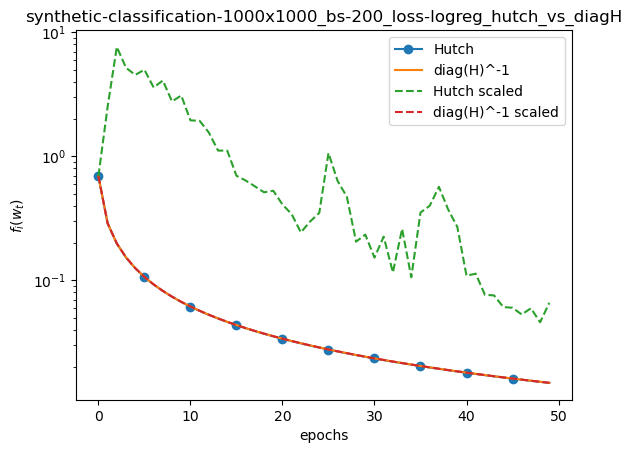

In [84]:
markevery = [x for x in range(0, len(hist_hutch), len(hist_hutch) // 10)]

plt.semilogy([x[0] for x in hist_hutch], marker="o", markevery=markevery, label=f"Hutch")
plt.semilogy([x[0] for x in hist_hd], label=f"diag(H)^-1")

plt.semilogy([x[0] for x in hist_hutch_scaled], linestyle="--", label=f"Hutch scaled")
plt.semilogy([x[0] for x in hist_hd_scaled], linestyle="--", label=f"diag(H)^-1 scaled")


plt.xlabel("epochs")
plt.ylabel(r"$f_i(w_t)$")
plt.legend()

title = f"{dataset_name}_bs-{batch_size}_loss-{loss_function.__name__}_hutch_vs_diagH"
plt.title(title)
# plt.savefig(f"experiments/plots/{title}.jpeg", dpi=200)

In [89]:
EPOCHS = 100

In [90]:
method = "pcg"
pcg_method = "hutch"
seed = 0

hist = run_psps2(train, EPOCHS, method, pcg_method, seed=seed, eps=0.0)
hist_scaled = run_psps2(train_scaled, EPOCHS, method, pcg_method, seed=seed, eps=0.0)

[0/100] | Loss: 0.6931471805599453 | GradNorm^2: 0.20795693287996542 | Accuracy: 0.0
[1/100] | Loss: 0.30505129323294355 | GradNorm^2: 0.05804031729971599 | Accuracy: 0.892
[2/100] | Loss: 0.12929952313193951 | GradNorm^2: 0.015316711789712306 | Accuracy: 0.968
[3/100] | Loss: 0.05478592899448647 | GradNorm^2: 0.004124334656062433 | Accuracy: 0.99
[4/100] | Loss: 0.029035439605884457 | GradNorm^2: 0.0013506560993797332 | Accuracy: 1.0
[5/100] | Loss: 0.02043447916073906 | GradNorm^2: 0.0009107920178986961 | Accuracy: 1.0
[6/100] | Loss: 0.015468381159500355 | GradNorm^2: 0.0006625866434878673 | Accuracy: 1.0
[7/100] | Loss: 0.012136336552334117 | GradNorm^2: 0.0005018494759181347 | Accuracy: 1.0
[8/100] | Loss: 0.009503750272467453 | GradNorm^2: 0.00035462311894111876 | Accuracy: 1.0
[9/100] | Loss: 0.007711825586456501 | GradNorm^2: 0.00026870304025143106 | Accuracy: 1.0
[10/100] | Loss: 0.006095632734740516 | GradNorm^2: 0.00019104764050159362 | Accuracy: 1.0
[11/100] | Loss: 0.00451

KeyboardInterrupt: 

Text(0.5, 1.0, 'mushrooms_bs-256_loss-nllsq_method-pcg_pcgmethod-hutch')

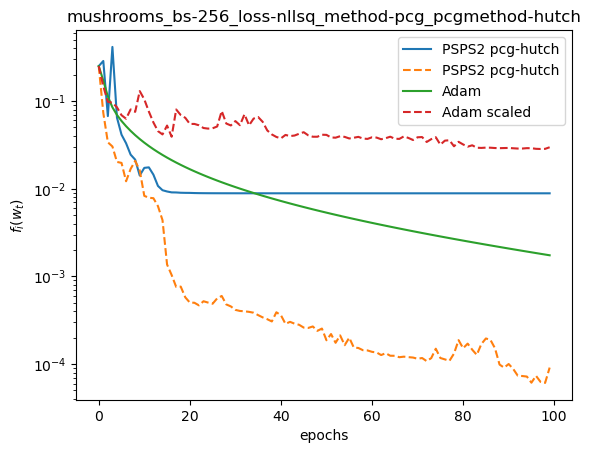

In [85]:
plt.semilogy([x[0] for x in hist], label=f"PSPS2 {method}-{pcg_method}")
plt.semilogy([x[0] for x in hist_scaled], linestyle="--", label=f"PSPS2 {method}-{pcg_method}")

plt.semilogy([x[0] for x in hist_adam], label=f"Adam")
plt.semilogy([x[0] for x in hist_adam_scaled], linestyle="--", label=f"Adam scaled")


plt.xlabel("epochs")
plt.ylabel(r"$f_i(w_t)$")
plt.legend()

title = f"{dataset_name}_bs-{batch_size}_loss-{loss_function.__name__}_method-{method}_pcgmethod-{pcg_method}"
plt.title(title)
# fig.savefig(f"experiments/plots/{title}.jpeg", dpi=200)

In [ ]:
hist_adam = run_optimizer(Adam, train, EPOCHS, lr=2**-8)
hist_adam_scaled = run_optimizer(Adam, train_scaled, EPOCHS, lr=2**-8)

[0/100] | Loss: 0.25 | GradNorm^2: 0.07989174018857569 | Acc: 0.48202855736090594
[1/100] | Loss: 0.17089007768138273 | GradNorm^2: 0.05294797698123539 | Acc: 0.517971442639094
[2/100] | Loss: 0.11289892340422897 | GradNorm^2: 0.016556301834052326 | Acc: 0.5110782865583456
[3/100] | Loss: 0.08477336835567144 | GradNorm^2: 0.007239576842461276 | Acc: 0.5114475627769571
[4/100] | Loss: 0.06941875415919972 | GradNorm^2: 0.004058141515480466 | Acc: 0.5120630231413097
[5/100] | Loss: 0.059221465991539074 | GradNorm^2: 0.002705333012557805 | Acc: 0.5120630231413097
[6/100] | Loss: 0.05162093199269137 | GradNorm^2: 0.001948768943090584 | Acc: 0.5120630231413097
[7/100] | Loss: 0.04565188354973692 | GradNorm^2: 0.0014673377159372604 | Acc: 0.5130477597242737
[8/100] | Loss: 0.040825062763652185 | GradNorm^2: 0.0011372277340047816 | Acc: 0.5136632200886263
[9/100] | Loss: 0.03684298114515731 | GradNorm^2: 0.0009000943117219454 | Acc: 0.5142786804529789
[10/100] | Loss: 0.03350564434042454 | Gra

In [43]:
EPOCHS = 500
for seed in [0, 1, 2, 3, 4]:
    for dataset, scale in zip([train, train_scaled], [0, scale]):
        hist = run_psps2(dataset, EPOCHS, "pcg", "hess_diag", seed=seed, eps=0.0)
        save_results(hist, dataset_name, 1.0, scale, batch_size, EPOCHS, loss_function.__name__, "psps2", 1.0, "pcg", "hess_diag", 1000, seed)


[0/500] | Loss: 0.6931471805599453 | GradNorm^2: 0.20795693287996542 | Accuracy: 0.0
[1/500] | Loss: 0.30504129221576853 | GradNorm^2: 0.05806755265519164 | Accuracy: 0.892
[2/500] | Loss: 0.12846088835920697 | GradNorm^2: 0.015109931032746078 | Accuracy: 0.969
[3/500] | Loss: 0.05522258365107101 | GradNorm^2: 0.00420443357356558 | Accuracy: 0.991
[4/500] | Loss: 0.029259793812727787 | GradNorm^2: 0.0013682588260505355 | Accuracy: 1.0
[5/500] | Loss: 0.02059745586282915 | GradNorm^2: 0.0009234466835597264 | Accuracy: 1.0
[6/500] | Loss: 0.015519866453434563 | GradNorm^2: 0.0006615793853695864 | Accuracy: 1.0
[7/500] | Loss: 0.012313937872341352 | GradNorm^2: 0.0005159587993797156 | Accuracy: 1.0
[8/500] | Loss: 0.009537171907027967 | GradNorm^2: 0.0003533122428892602 | Accuracy: 1.0
[9/500] | Loss: 0.00774332275206658 | GradNorm^2: 0.00026886974107051114 | Accuracy: 1.0
[10/500] | Loss: 0.006116597036916001 | GradNorm^2: 0.00018877351418977658 | Accuracy: 1.0
[11/500] | Loss: 0.0045798

In [44]:
lr = 2 ** -8
for opt in [Adam, Adagrad, Adadelta]:
    for seed in [0, 1, 2, 3, 4]:
        for dataset, scale in zip([train, train_scaled], [0, scale]):
            hist = run_optimizer(opt, train, EPOCHS, lr=lr)
            save_results(hist, dataset_name, 1.0, scale, batch_size, EPOCHS, loss_function.__name__, opt.__name__.lower(), lr, "none", "none", 1000, seed)


[0/500] | Loss: 0.6931471805599453 | GradNorm^2: 0.20795693287996542 | Acc: 0.0
[1/500] | Loss: 0.5824199951025605 | GradNorm^2: 0.14408774140305033 | Acc: 0.856
[2/500] | Loss: 0.48974525264550317 | GradNorm^2: 0.09704541557191744 | Acc: 0.905
[3/500] | Loss: 0.4186037066784127 | GradNorm^2: 0.0672566719094635 | Acc: 0.929
[4/500] | Loss: 0.3637385143198274 | GradNorm^2: 0.04863494821740208 | Acc: 0.945
[5/500] | Loss: 0.3205991389464881 | GradNorm^2: 0.03659971634351417 | Acc: 0.958
[6/500] | Loss: 0.2859383520401555 | GradNorm^2: 0.028449950982411754 | Acc: 0.968
[7/500] | Loss: 0.25755344831423965 | GradNorm^2: 0.022690022800436367 | Acc: 0.976
[8/500] | Loss: 0.23393369154270133 | GradNorm^2: 0.018476104604309825 | Acc: 0.978
[9/500] | Loss: 0.21400770419747744 | GradNorm^2: 0.015306945465408894 | Acc: 0.987
[10/500] | Loss: 0.19699075707572916 | GradNorm^2: 0.012868106245326458 | Acc: 0.991
[11/500] | Loss: 0.182295125736101 | GradNorm^2: 0.010953510782814294 | Acc: 0.996
[12/500

In [ ]:
# EPOCHS = 500
# for seed in [0, 1, 2, 3, 4]:
#     for dataset, eps, scale in zip([train, train_scaled], [1e-1, 1e-5], [0, scale]):
#         hist = run_psps2(dataset, EPOCHS, "pcg", "adagrad", seed=seed, eps=eps)
#         save_results(hist, dataset_name, 1.0, scale, batch_size, EPOCHS, loss_function.__name__, "psps2", 1.0, "pcg", "adagrad", 1000, seed)

# EPOCHS = 500
# lr=0.01

# for opt in [Adam, Adagrad, Adadelta]:
#     for seed in [0, 1, 2, 3, 4]:
#         for dataset, scale in zip([train, train_scaled], [0, scale]):
#             hist = run_optimizer(opt, train, EPOCHS, lr=lr)
#             save_results(hist, dataset_name, 1.0, scale, batch_size, EPOCHS, loss_function.__name__, opt.__name__.lower(), lr, "none", "none", 1000, seed)


In [19]:
hist_pcg_none = run_psps2(train, EPOCHS, "pcg", "none")
hist_pcg_none_scaled = run_psps2(train_scaled, EPOCHS, "pcg", "none")

[0/50] | Loss: 0.6931471805599453 | GradNorm^2: 0.16975426525350082 | Accuracy: 0.0
[1/50] | Loss: 0.7816868319632643 | GradNorm^2: 0.13285622143128706 | Accuracy: 0.7
[2/50] | Loss: 0.5165442374542825 | GradNorm^2: 0.08180777079996919 | Accuracy: 0.795
[3/50] | Loss: 0.5915133112401377 | GradNorm^2: 0.0823976724251792 | Accuracy: 0.778
[4/50] | Loss: 0.5189488080591165 | GradNorm^2: 0.0843913164466676 | Accuracy: 0.758
[5/50] | Loss: 0.5721544665634437 | GradNorm^2: 0.08740672039156058 | Accuracy: 0.773
[6/50] | Loss: 0.6050824241044045 | GradNorm^2: 0.0867173262505714 | Accuracy: 0.768
[7/50] | Loss: 0.6275123864600726 | GradNorm^2: 0.09719251916935631 | Accuracy: 0.743
[8/50] | Loss: 0.574483227528337 | GradNorm^2: 0.08356736958606242 | Accuracy: 0.773
[9/50] | Loss: 0.5140062895149184 | GradNorm^2: 0.0695472227990025 | Accuracy: 0.801
[10/50] | Loss: 0.7082618015121477 | GradNorm^2: 0.10968978215351952 | Accuracy: 0.737
[11/50] | Loss: 0.6117317114680272 | GradNorm^2: 0.09601485504

KeyboardInterrupt: 

In [84]:
hist_pcg_adam = run_psps2(train, EPOCHS, "pcg", "adam")
hist_pcg_adam_scaled = run_psps2(train_scaled, EPOCHS, "pcg", "adam")

[0/50] | Loss: 0.6931471805599453 | GradNorm^2: 0.16975426525350082 | Accuracy: 0.0
[1/50] | Loss: 0.781940258299283 | GradNorm^2: 0.1329197926194632 | Accuracy: 0.701
[2/50] | Loss: 0.5241503899579915 | GradNorm^2: 0.08348414424431934 | Accuracy: 0.792
[3/50] | Loss: 0.6450582356399909 | GradNorm^2: 0.10991216355526905 | Accuracy: 0.745
[4/50] | Loss: 0.5523704044227754 | GradNorm^2: 0.08404498555920423 | Accuracy: 0.77
[5/50] | Loss: 0.7649282761820438 | GradNorm^2: 0.12795959583512048 | Accuracy: 0.692
[6/50] | Loss: 0.641258598830028 | GradNorm^2: 0.10736261245388724 | Accuracy: 0.738
[7/50] | Loss: 0.6904391157843931 | GradNorm^2: 0.10480862806174317 | Accuracy: 0.768
[8/50] | Loss: 0.52915653587722 | GradNorm^2: 0.07477372035322426 | Accuracy: 0.794
[9/50] | Loss: 0.6071280044166385 | GradNorm^2: 0.09779513292862342 | Accuracy: 0.754
[10/50] | Loss: 0.6475622360261654 | GradNorm^2: 0.09524567490282 | Accuracy: 0.74
[11/50] | Loss: 0.6679483911080072 | GradNorm^2: 0.10098760413795

In [85]:
hist_pcg_adagrad = run_psps2(train, EPOCHS, "pcg", "adagrad")
hist_pcg_adagrad_scaled = run_psps2(train_scaled, EPOCHS, "pcg", "adagrad")

[0/50] | Loss: 0.6931471805599453 | GradNorm^2: 0.16975426525350082 | Accuracy: 0.0
[1/50] | Loss: 0.7817792663427044 | GradNorm^2: 0.13287578629974858 | Accuracy: 0.7
[2/50] | Loss: 0.5296352326430006 | GradNorm^2: 0.08485792979234504 | Accuracy: 0.786
[3/50] | Loss: 0.6944608878242081 | GradNorm^2: 0.10855391077121955 | Accuracy: 0.747
[4/50] | Loss: 0.7517627730090113 | GradNorm^2: 0.12412406776868722 | Accuracy: 0.719
[5/50] | Loss: 0.5711370403997571 | GradNorm^2: 0.08426057799426523 | Accuracy: 0.777
[6/50] | Loss: 0.6434475323293627 | GradNorm^2: 0.09321374041073131 | Accuracy: 0.767
[7/50] | Loss: 0.5771009621774978 | GradNorm^2: 0.1042536946416536 | Accuracy: 0.733
[8/50] | Loss: 0.5539798545862136 | GradNorm^2: 0.09311513608306213 | Accuracy: 0.749
[9/50] | Loss: 0.6337319399860382 | GradNorm^2: 0.09702710402341773 | Accuracy: 0.751
[10/50] | Loss: 0.4637622991217072 | GradNorm^2: 0.06991484946478868 | Accuracy: 0.803
[11/50] | Loss: 0.8327113758652496 | GradNorm^2: 0.1361831

In [86]:
hist_pcg_hessian = run_psps2(train, EPOCHS, "pcg", "hessian")
hist_pcg_hessian_scaled = run_psps2(train_scaled, EPOCHS, "pcg", "hessian")

[0/50] | Loss: 0.6931471805599453 | GradNorm^2: 0.16975426525350082 | Accuracy: 0.0
[1/50] | Loss: 0.7816869234659383 | GradNorm^2: 0.1328562400049843 | Accuracy: 0.7
[2/50] | Loss: 0.5165451311952609 | GradNorm^2: 0.0818080801701245 | Accuracy: 0.795
[3/50] | Loss: 0.5915225337379822 | GradNorm^2: 0.08240032834280556 | Accuracy: 0.778
[4/50] | Loss: 0.5199550514802329 | GradNorm^2: 0.084637013427886 | Accuracy: 0.754
[5/50] | Loss: 0.5863346694749262 | GradNorm^2: 0.09222955234295199 | Accuracy: 0.77
[6/50] | Loss: 0.42198751364519393 | GradNorm^2: 0.05731418702162419 | Accuracy: 0.829
[7/50] | Loss: 0.6823742937742324 | GradNorm^2: 0.11565915778978188 | Accuracy: 0.734
[8/50] | Loss: 0.5869836785825362 | GradNorm^2: 0.07628137868522392 | Accuracy: 0.782
[9/50] | Loss: 0.48142162879236217 | GradNorm^2: 0.06899864583303608 | Accuracy: 0.797
[10/50] | Loss: 0.5577306415830197 | GradNorm^2: 0.08557686612368667 | Accuracy: 0.771
[11/50] | Loss: 0.6915862008923589 | GradNorm^2: 0.101721944

In [87]:
hist_adam = run_optimizer(Adam, train, EPOCHS, lr=0.01)
hist_adam_scaled = run_optimizer(Adam, train_scaled, EPOCHS, lr=0.01)

[0/50] | Loss: 0.6931471805599453 | GradNorm^2: 0.16975426525350082 | Acc: 0.0
[1/50] | Loss: 0.5817766157270732 | GradNorm^2: 0.110934801213145 | Acc: 0.844
[2/50] | Loss: 0.49898610714667485 | GradNorm^2: 0.07236683114523139 | Acc: 0.866
[3/50] | Loss: 0.4384796784208604 | GradNorm^2: 0.04965055643375558 | Acc: 0.879
[4/50] | Loss: 0.39318184541978773 | GradNorm^2: 0.03604807771081098 | Acc: 0.893
[5/50] | Loss: 0.3580649174802702 | GradNorm^2: 0.027343857229961528 | Acc: 0.9
[6/50] | Loss: 0.3300272212765127 | GradNorm^2: 0.02139965478082078 | Acc: 0.917
[7/50] | Loss: 0.3071453788481766 | GradNorm^2: 0.017145316776805464 | Acc: 0.925
[8/50] | Loss: 0.2881474472540912 | GradNorm^2: 0.014002812298241964 | Acc: 0.935
[9/50] | Loss: 0.27213933465032564 | GradNorm^2: 0.011628721293853254 | Acc: 0.942
[10/50] | Loss: 0.25846802919651757 | GradNorm^2: 0.009802802927747255 | Acc: 0.948
[11/50] | Loss: 0.24664567228333995 | GradNorm^2: 0.008376132226950453 | Acc: 0.955
[12/50] | Loss: 0.236

In [88]:
hist_psps2_newton = run_psps2(train, EPOCHS, "newton", "none")
hist_psps2_newton_scaled = run_psps2(train_scaled, EPOCHS, "newton", "none")

[0/50] | Loss: 0.6931471805599453 | GradNorm^2: 0.16975426525350082 | Accuracy: 0.0
[1/50] | Loss: 0.7816869234659533 | GradNorm^2: 0.1328562400049867 | Accuracy: 0.7
[2/50] | Loss: 0.5165451311953366 | GradNorm^2: 0.08180808017014207 | Accuracy: 0.795
[3/50] | Loss: 0.5915225337401765 | GradNorm^2: 0.0824003283433225 | Accuracy: 0.778
[4/50] | Loss: 0.5199550515548229 | GradNorm^2: 0.08463701344538335 | Accuracy: 0.754
[5/50] | Loss: 0.586334670630816 | GradNorm^2: 0.09222955265764787 | Accuracy: 0.77
[6/50] | Loss: 0.4219875185204529 | GradNorm^2: 0.05731418821316684 | Accuracy: 0.829
[7/50] | Loss: 0.6823746498556391 | GradNorm^2: 0.11565919579683274 | Accuracy: 0.734
[8/50] | Loss: 0.5869778258849184 | GradNorm^2: 0.07628063877925258 | Accuracy: 0.782
[9/50] | Loss: 0.48142361245693926 | GradNorm^2: 0.06900000951322162 | Accuracy: 0.797
[10/50] | Loss: 0.5585951608516826 | GradNorm^2: 0.08576610653440032 | Accuracy: 0.773
[11/50] | Loss: 0.6592027707663081 | GradNorm^2: 0.094317112

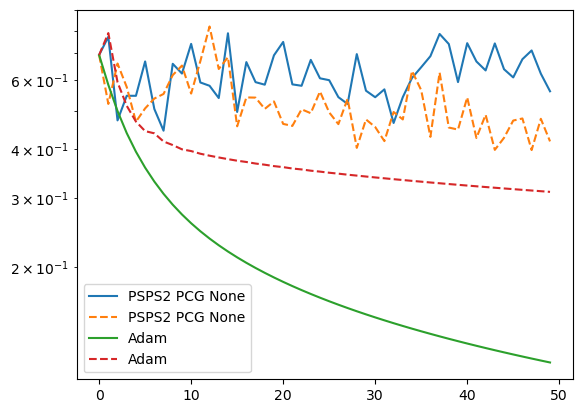

In [98]:
plt.semilogy([x[0] for x in hist_pcg_none], label="PSPS2 PCG None")
plt.semilogy([x[0] for x in hist_pcg_none_scaled], linestyle="--", label="PSPS2 PCG None")

# plt.semilogy([x[0] for x in hist_pcg_adam], label="PSPS2 PCG Adam")
# plt.semilogy([x[0] for x in hist_pcg_adam_scaled], linestyle="--", label="PSPS2 PCG Adam")

# plt.semilogy([x[0] for x in hist_psps2_newton], label="PSPS2 Newton")
# plt.semilogy([x[0] for x in hist_psps2_newton_scaled], linestyle="--", label="PSPS2 Newton")

# plt.semilogy([x[0] for x in hist_pcg_adagrad], label="PSPS2 PCG Adagrad")
# plt.semilogy([x[0] for x in hist_pcg_adagrad_scaled], linestyle="--", label="PSPS2 PCG Adagrad")

# plt.semilogy([x[0] for x in hist_pcg_hessian], label="PSPS2 PCG Hessian")
# plt.semilogy([x[0] for x in hist_pcg_hessian_scaled], linestyle="--", label="PSPS2 PCG Hessian")

# plt.semilogy([x[0] for x in hist_pcg_hutch], label="PSPS2 PCG Hutch")
# plt.semilogy([x[0] for x in hist_pcg_hutch_scaled], linestyle="--", label="PSPS2 PCG Hutch")

plt.semilogy([x[0] for x in hist_adam], label="Adam")
plt.semilogy([x[0] for x in hist_adam_scaled], linestyle="--", label="Adam")

# plt.semilogy([x[0] for x in hist_adagrad], label="Adagrad")
# plt.semilogy([x[0] for x in hist_adagrad_scaled], linestyle="--", label="Adagrad")


# plt.ylim(bottom=1e-5)

plt.legend()
# plt.savefig(f"experiments/plots/testtest.jpeg", format="jpeg", dpi=200)

In [52]:
def run_newton(dataset, epochs, seed=0):

    torch.manual_seed(seed)

    data, target, dataloader = dataset

    # parameters
    w = torch.zeros(data.shape[1], device=device).requires_grad_()

    # save loss and grad size to history
    hist = []

    for epoch in range(epochs):

        # EVAL
        loss = lf.logreg(w, data.to(device), target.to(device))
        g, = torch.autograd.grad(loss, w, create_graph=True)
        grad_norm_sq = torch.linalg.norm(g) ** 2  
        acc = (np.sign(data @ w.detach().numpy()) == target).sum() / target.shape[0]
        print(f"[{epoch}/{epochs}] | Loss: {loss.item()} | GradNorm^2: {grad_norm_sq.item()} | Accuracy: {acc}")
        hist.append([loss.item(), grad_norm_sq.item(), acc])
        # END EVAL
            
        for i, (batch_data, batch_target) in enumerate(dataloader): 
            
            loss = lf.logreg(w, batch_data, batch_target)
            g, = torch.autograd.grad(loss, w)
            closure = lambda w: lf.logreg(w, batch_data, batch_target)
            hess = torch.autograd.functional.hessian(closure, w)
            s = torch.linalg.solve(hess, g)

            step_size = 1.0
            with torch.no_grad():
                w.sub_(s, alpha=step_size)

    return hist

In [53]:
hist_newton = run_newton(train, 50)
hist_newton_scaled = run_newton(train_scaled, 50)

[0/50] | Loss: 0.6931471805599453 | GradNorm^2: 0.16975426525350082 | Accuracy: 0.0
[1/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[2/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[3/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[4/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[5/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[6/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[7/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[8/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[9/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[10/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[11/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[12/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[13/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[14/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[15/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[16/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[17/50] | Loss: nan | GradNorm^2: nan | Accuracy: 0.0
[18/50]

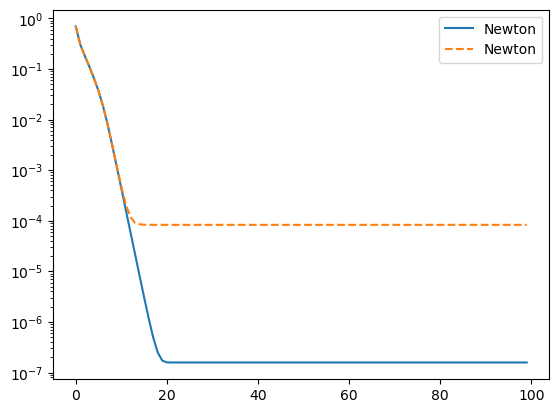

In [43]:
plt.semilogy([x[0] for x in hist_newton], label="Newton")
plt.semilogy([x[0] for x in hist_newton_scaled], linestyle="--", label="Newton")

plt.legend()

# Non-Convex PSPS2 CG

In [170]:
def rademacher_old(weights):
    return torch.round(torch.rand_like(weights)) * 2 - 1

def diag_estimate_old(weights, grad, iters):
    Ds = []
    for j in range(iters):
        z = rademacher_old(weights)
        with torch.no_grad():
            hvp = torch.autograd.grad(grad, weights, grad_outputs=z, retain_graph=True)[0]
        Ds.append((hvp*z))

    return torch.mean(torch.stack(Ds), 0)

def run_psps2_nc(train_data, train_target, train_dataloader, epochs, precond_method="cg", seed=0, **kwargs):

    torch.manual_seed(seed)

    # parameters
    w = torch.zeros(train_data.shape[1], device=device).requires_grad_()

    # save loss and grad size to history
    hist = []


    loss = loss_function(w, train_data.to(device), train_target.to(device))
    g, = torch.autograd.grad(loss, w, create_graph=True)
    f_grad = g.clone().detach()


    if precond_method == "cg" or precond_method == "pcg":
        s = torch.zeros_like(w) # s = H_inv * grad
        r = f_grad - torch.autograd.grad(g, w, grad_outputs=s, retain_graph=True)[0]
        p = r.detach().clone()
        r_prev = torch.dot(r, r)
        MAX_ITER = train_data.shape[1] * 2
        # MAX_ITER = 1000


    for epoch in range(epochs):

        loss = loss_function(w, train_data.to(device), train_target.to(device))
        g, = torch.autograd.grad(loss, w, create_graph=True)
        grad_norm_sq = torch.linalg.norm(g) ** 2
        acc = (np.sign(train_data @ w.detach().numpy()) == train_target).sum() / train_target.shape[0]

        print(f"[{epoch}/{epochs}] | Loss: {loss.item()} | GradNorm^2: {grad_norm_sq.item()} | Accuracy: {acc}")
        hist.append([loss.item(), grad_norm_sq.item(), acc])

        for i, (batch_data, batch_target) in enumerate(train_dataloader):

            loss = loss_function(w, batch_data, batch_target)
            g, = torch.autograd.grad(loss, w, create_graph=True)
            f_grad = g.detach().clone()

            # ssstep = 1.0

            if i % 64 == 0:
                loss = loss_function(w, train_data.to(device), train_target.to(device))
                g, = torch.autograd.grad(loss, w, create_graph=True)
                grad_norm_sq = torch.linalg.norm(g) ** 2
                print(f"[{epoch}][{i}] | Loss: {loss.item()} | GradNorm^2: {grad_norm_sq.item()} | Accuracy: {acc}")
                # hist.append([loss.item(), grad_norm_sq.item(), acc])

            if precond_method == "cg":


                # estimate the TR radius from Polyak-step-size
                trDelta = (loss / ( f_grad.dot(f_grad) )).item()
                # print("trDelta",trDelta)


                gamma=0.9

                # CG is here
                s = torch.zeros_like(w) # s = H_inv * grad
                z = torch.zeros_like(w)
                r = f_grad.clone()
                p = r.clone()
                # tt=f_grad.clone()
                for cg_step in range(MAX_ITER):
                    hvp = torch.autograd.grad(g, w, grad_outputs=p, retain_graph=True)[0]

                    # print(torch.dot(p,hvp))
                    if torch.dot(p,hvp)<=0: 
                        # print("NEGATIVE CURVATURE")
                        # if torch.dot(p,f_grad)<=0:
                        s=gamma*z*torch.sign(torch.dot(z,f_grad))+(1-gamma)*p*torch.sign(torch.dot(p,f_grad))
                        # else:
                            # s=-p
                        # hvs = torch.autograd.grad(g, w, grad_outputs=s, retain_graph=True)[0]
                        # ssstep=torch.dot(s,f_grad)/torch.dot(s,hvs)
                        step_size=torch.min(torch.tensor([loss/torch.dot(s,s),50]))
                        # print("*")
                        break



                    # print(">",cg_step)
                    # print(">",torch.dot(p,hvp))
                    alpha_k = torch.dot(r, r) / torch.dot(p, hvp)
                    z = z + alpha_k * p
                    r_prev = r.clone()
                    r = r - alpha_k * hvp
                    if torch.norm(r) < 1e-4:
                        s=z
                        # hvs = torch.autograd.grad(g, w, grad_outputs=s, retain_graph=True)[0]
    
                        # Ax = torch.autograd.grad(g, w, grad_outputs=s, retain_graph=True)[0]
                        # diff = torch.norm(Ax - f_grad)
                        # print(f"CG Took {cg_step} to reach diff={diff}")
                        # cg_steps.append(cg_step)
                        grad_norm_sq_scaled = torch.dot(f_grad, s)
                        if 2 * loss <= grad_norm_sq_scaled:
                            c = loss / ( grad_norm_sq_scaled )
                            det = 1 - 2 * c
                            if det < 0.0:
                                step_size = 1.0
                            else:
                                # print("**")
                                step_size = 1 - torch.sqrt(det)
                        else:
                            # print(f"[{epoch}, {i}] No solution")
                            # print("***")
                            step_size = 1.0
                        
                        
                        break

                    beta_k = torch.dot(r, r) / torch.dot(r_prev, r_prev)
                    p = r + beta_k * p

            step_size = step_size
            # print("step_size",step_size)
            # FB =  loss_function(w, train_data.to(device), train_target.to(device))
            # FBB =  loss_function(w, batch_data, batch_target)
            with torch.no_grad():
                w.sub_(step_size *s)
            # FA =  loss_function(w, train_data.to(device), train_target.to(device))
            # FAA =  loss_function(w, batch_data, batch_target)
            
            # print(FA - FB, " <<< 0", FAA - FBB)
            # if i > 50:
            #   return ''

    return hist


In [171]:
hist_cg = run_psps2_nc(train_data, train_target, train_dataloader, EPOCHS, precond_method="cg", seed=2)
hist_cg_scaled = run_psps2_nc(train_data_scaled, train_target, train_dataloader_scaled, EPOCHS, precond_method="cg", seed=2)

In [172]:
hist_adam = run_optimizer(Adam, train_data, train_target, train_dataloader, EPOCHS, lr=0.1)
hist_adam_scaled = run_optimizer(Adam, train_data_scaled, train_target, train_dataloader_scaled, EPOCHS, lr=0.01)

In [173]:
plt.semilogy([x[0] for x in hist_cg], label="CG")
plt.semilogy([x[0] for x in hist_adam], label="Adam")

plt.semilogy([x[0] for x in hist_cg_scaled], linestyle="--", label="CG")
plt.semilogy([x[0] for x in hist_adam_scaled], linestyle="--", label="Adam")

plt.legend()

# plt.savefig(f"experiments/plots/non-convex-cg_vs_adam-gamma-0_1.jpeg", format="jpeg", dpi=200)
